## Estella Project
This version does not allow cells to divide after they reach confluency

In [1]:
using Plots

In [2]:
using RollingFunctions

In [3]:
using Statistics

In [4]:
mutable struct polygono
            p1
            p2
            p3
            p4
            age
            tipo
       end

In [5]:
function distance(A,B)
	sqrt((B[1]-A[1])^2+(B[2]-A[2])^2)
end

distance (generic function with 1 method)

In [6]:
function midpoint(xx)
         x = (xx.p1[1] + xx.p2[1] + xx.p3[1] + xx.p4[1]) / 4
         y = (xx.p1[2] + xx.p2[2] + xx.p3[2] + xx.p4[2]) / 4
    return x
    
end

midpoint (generic function with 1 method)

In [7]:
function height(xx)
         y = max(xx.p3[2],xx.p2[2])#( + xx.p2[2]) / 2
    return y
    
end

height (generic function with 1 method)

In [8]:
function width(xx)
         y = xx.p3[1]-xx.p2[1]#( + xx.p2[2]) / 2
    return y
end

width (generic function with 1 method)

In [9]:
max(2,3)

3

In [10]:
function semiperemeter(A,B,C)
        (distance(A,B) + distance(B,C) + distance(C,A))/2
end

semiperemeter (generic function with 1 method)

In [11]:
function heron(A,B,C)
    sqrt(semiperemeter(A,B,C)*(semiperemeter(A,B,C)−distance(A,B))*(semiperemeter(A,B,C)−distance(B,C))*(semiperemeter(A,B,C)−distance(C,A)))
end

heron (generic function with 1 method)

In [12]:
function volume_function(xx)
        A=xx.p1
        B=xx.p2
        C=xx.p3
        D=xx.p4
        volume1=sqrt(semiperemeter(A,B,C)*(semiperemeter(A,B,C)−distance(A,B))*(semiperemeter(A,B,C)−distance(B,C))*(semiperemeter(A,B,C)−distance(C,A)))
        volume2=sqrt(semiperemeter(C,D,A)*(semiperemeter(C,D,A)−distance(C,D))*(semiperemeter(C,D,A)−distance(D,A))*(semiperemeter(C,D,A)−distance(A,C)))

        volume1+volume2
end

volume_function (generic function with 1 method)

In [13]:
function set_old_cell(xxx)
        xxx.p4=(xxx.p1 + xxx.p4) / 2
        xxx.p3=(xxx.p2 + xxx.p3) / 2
        xxx.age=0.0
    return xxx.age
    end 

set_old_cell (generic function with 1 method)

In [14]:
function set_new_cell_red(xx,xxx,xxxx)
        #point1=eval(Meta.parse((string("cell_",chosen_cell_for_division)))).p1
        #point2=eval(Meta.parse((string("cell_",chosen_cell_for_division)))).p2
        #point3=eval(Meta.parse((string("cell_",chosen_cell_for_division)))).p3
        #point4=eval(Meta.parse((string("cell_",chosen_cell_for_division)))).p4
        xxx.p1=xx.p4
        xxx.p2=xx.p3
        xxx.p3=xxxx.p2
        xxx.p4=xxxx.p1
        xxx.age=0.0
        xxx.tipo=1.0
    end 

set_new_cell_red (generic function with 1 method)

In [15]:
function set_new_cell_blue(xx,xxx,xxxx)
        #point1=eval(Meta.parse((string("cell_",chosen_cell_for_division)))).p1
        #point2=eval(Meta.parse((string("cell_",chosen_cell_for_division)))).p2
        #point3=eval(Meta.parse((string("cell_",chosen_cell_for_division)))).p3
        #point4=eval(Meta.parse((string("cell_",chosen_cell_for_division)))).p4
        xxx.p1=xx.p4
        xxx.p2=xx.p3
        xxx.p3=xxxx.p2
        xxx.p4=xxxx.p1
        xxx.age=0.0
        xxx.tipo=0.0
    end 

set_new_cell_blue (generic function with 1 method)

In [16]:
function reduce_size_vector(xx)
    xx_mean = rollmean(Float64.(xx[1:end]), 50)
    xx_mean_reduce = xx_mean[1:10:end]
    return xx_mean_reduce
end

reduce_size_vector (generic function with 1 method)

In [17]:
function growth_by_compressing_neighbours_apically_small_cells_only(xx,xxx,xxxx,growth,aging) # 
    treshold_for_growing_horizontally = 0.4
    volume_for_growing_horizontally = 0.01
     # lets put that confluent cells do not divide anymore
    volume_xxx=volume_function(xxx)
    
    if  volume_xxx > volume_for_growing_horizontally * 20
        xxx.age=xxx.age .+ aging 
    end
    
    
    #if volume_xxx < 2.5
    random_value=rand(1); # this value is to make things more random-like    
    volume_xx=volume_function(xx)    
    volume_xxxx=volume_function(xxxx)
        
    # Horizontal growth
        if      xxxx.p3[1]-xxxx.p2[1] > treshold_for_growing_horizontally && volume_xxxx > volume_for_growing_horizontally  &&  0.0 < random_value[1] < 0.25  # if room to the up right then 
                xxx.p3[1]= xxx.p3[1] + growth # expand p3 right
                xxxx.p2[1]=xxx.p3[1]    # push p2 right in next cell
           
        end
    
        if      xx.p3[1]-xx.p2[1] > treshold_for_growing_horizontally && volume_xx > volume_for_growing_horizontally  && 0.25 < random_value[1] < 0.50 # if room to the up left 
                xxx.p2[1]= xxx.p2[1] - growth #then expand p2 left
                xx.p3[1]=xxx.p2[1]    # push p3 left in previous cell
            
        end
    
        if      xxxx.p4[1]-xxxx.p1[1] > treshold_for_growing_horizontally && volume_xxxx > volume_for_growing_horizontally  &&  0.50 < random_value[1] < 0.75 # if room to the low right then 
                xxx.p4[1]= xxx.p4[1] +  growth # expand p4 right
                xxxx.p1[1]=xxx.p4[1]    # push p1 right in next cell
        end
    
        if      xx.p4[1]-xx.p1[1] > treshold_for_growing_horizontally && volume_xx > volume_for_growing_horizontally && 0.75 < random_value[1] < 1.0  # if room to the low left 
                xxx.p1[1]= xxx.p1[1] - growth #then expand p1 left
                xx.p4[1]=xxx.p1[1]    # push p4 left in previous cell 
        end
    
     
    #vertical growth when they cannot grow horizontally
    
        if  0.01 < xxxx.p3[1]-xxxx.p2[1] < treshold_for_growing_horizontally && volume_xxxx > volume_for_growing_horizontally && xxxx.p2[2]-xxxx.p3[2] < 0.1 && xxx.p3[2]-xxx.p2[2] < 0.1 && (xxx.p2[2]+xxx.p3[2])/2 < 1.5    # keep growing if not too tall
             if xxxx.tipo ==  0.0 && 0.0 < random_value[1] < 0.25 # if no room to the right and next cell is normal then 
                xxx.p3[2] = xxx.p3[2] + growth # expand p3 up
                xxxx.p2[2] = xxx.p3[2]    # push p2 up in next cell
             end 
             if xxxx.tipo ==  0.0 && 0.25 < random_value[1] < 0.50 
                xxx.p3[1] = xxx.p3[1] + growth # compress it by expand p3 right
                xxxx.p2[1] = xxx.p3[1]    # push p2 in next cell
             end
              if xxxx.tipo ==  1.0 && 0.5 < random_value[1] < 0.75 
                xxx.p3[1] = xxx.p3[1] + growth # compress it by expand p3 right
                xxxx.p2[1] = xxx.p3[1]    # push p2 in next cell
            end
        end
    ### cambiar aqui lo de abajo
        if  0.01 < xx.p3[1]-xx.p2[1] < treshold_for_growing_horizontally && volume_xx > volume_for_growing_horizontally && xx.p3[2]-xx.p2[2] < 0.1 && xxx.p2[2]-xxx.p3[2] < 0.1 && (xxx.p2[2]+xxx.p3[2])/2 < 1.5    
           if xx.tipo ==  0.0 && 0.0 < random_value[1] < 0.25 #if previous cell is not special, then expand p2 up
                 xxx.p2[2]= xxx.p2[2] + growth 
                 xx.p3[2]=xxx.p2[2]    # push p3 up in previous cell
           end
           if xx.tipo ==  0.0 && 0.25 < random_value[1] < 0.5 #if previous cell is not special, then expand p2 up
                 xxx.p2[1] = xxx.p2[1] - growth #then expand p2 left
                 xx.p3[1]=xxx.p2[1]    # push p3 in previous cell
           end
           if xx.tipo ==  1.0 && 0.5 < random_value[1] < 0.75 
                xxx.p2[1] = xxx.p2[1] - growth #then expand p2 left
                xx.p3[1]=xxx.p2[1]    # push p3 in previous cell
           end
        end
     #end
   # end
       
end 

growth_by_compressing_neighbours_apically_small_cells_only (generic function with 1 method)

In [18]:
function growth_by_compressing_neighbours_basally_small_cells_only(xx,xxx,xxxx,growth,aging) # 
    
    treshold_for_growing_horizontally = 0.4
    volume_for_growing_horizontally = 0.01
     # lets put that confluent cells do not divide anymore
    volume_xxx=volume_function(xxx)
    
    if  volume_xxx > volume_for_growing_horizontally * 20
        xxx.age=xxx.age .+ aging 
    end
    
    
    #if volume_xxx < 5.0
    random_value=rand(1); # this value is to make things more random-like    
    volume_xx=volume_function(xx)    
    volume_xxxx=volume_function(xxxx)
        
    # Horizontal growth
        if      xxxx.p3[1]-xxxx.p2[1] > treshold_for_growing_horizontally && volume_xxxx > volume_for_growing_horizontally  &&  0.0 < random_value[1] < 0.25  # if room to the up right then 
                xxx.p3[1]= xxx.p3[1] + growth # expand p3 right
                xxxx.p2[1]=xxx.p3[1]    # push p2 right in next cell
 
           
        end
    
        if      xx.p3[1]-xx.p2[1] > treshold_for_growing_horizontally && volume_xx > volume_for_growing_horizontally  && 0.25 < random_value[1] < 0.50 # if room to the up left 
                xxx.p2[1]= xxx.p2[1] - growth #then expand p2 left
                xx.p3[1]=xxx.p2[1]    # push p3 left in previous cell
            
        end
    
        if      xxxx.p4[1]-xxxx.p1[1] > treshold_for_growing_horizontally && volume_xxxx > volume_for_growing_horizontally  &&  0.50 < random_value[1] < 0.75 # if room to the low right then 
                xxx.p4[1]= xxx.p4[1] +  growth # expand p4 right
                xxxx.p1[1]=xxx.p4[1]    # push p1 right in next cell
        end
    
        if      xx.p4[1]-xx.p1[1] > treshold_for_growing_horizontally && volume_xx > volume_for_growing_horizontally && 0.75 < random_value[1] < 1.0  # if room to the low left 
                xxx.p1[1]= xxx.p1[1] - growth #then expand p1 left
                xx.p4[1]=xxx.p1[1]    # push p4 left in previous cell 
        end
    
     
  
        #basal growth when they cannot grow horizontally
     
    
       # if     0.05 < xxxx.p3[1]-xxxx.p2[1] < treshold_for_growing_horizontally && volume_xxxx > volume_for_growing_horizontally && xxxx.p4[1]-xxxx.p1[1] >  0.01 && 0.0 < random_value[1] < 0.5 
      if        xxxx.p3[1]-xxxx.p2[1] < treshold_for_growing_horizontally && 0.0 < random_value[1] < 0.5 && xxxx.p4[1]-xxxx.p1[1] >  0.01
          if    xxxx.tipo ==  0.0  # if next cell is normal then 
                xxx.p4[1] = xxx.p4[1] + growth # expand basally to the right 
                xxxx.p1[1] = xxx.p4[1]    # push p1  in next cell#
          end
      end
          
    #if        xx.p3[1]-xx.p2[1] < treshold_for_growing_horizontally && volume_xx > volume_for_growing_horizontally && xx.p4[1]-xx.p1[1] > 0.01 && 0.5 < random_value[1] < 1.0 
        if       xx.p3[1]-xx.p2[1] < treshold_for_growing_horizontally && 0.5 < random_value[1] < 1.0 && xx.p4[1]-xx.p1[1] >  0.01
            if   xx.tipo ==  0.0  # if previous  cell is normal then
                 xxx.p1[1] = xxx.p1[1] - growth # if cell is special then expand
                 xx.p4[1] = xxx.p1[1]    # push p4 in next cell
            end
         end
   
    #end
  
       
    end 

growth_by_compressing_neighbours_basally_small_cells_only (generic function with 1 method)

In [19]:
function tissue_growth_proliferation_horizontal_small_cells_only(initial_number_of_cells,growth,total_time,aging)
draw_and_save_every=100
number_of_cells = initial_number_of_cells
size_of_system=initial_number_of_cells*initial_size_x; # calculate the size in x of our system
vector_de_alturas_red = Vector{Float64}(undef,Int(total_time/draw_and_save_every))  
vector_de_alturas_blue = Vector{Float64}(undef,Int(total_time/draw_and_save_every))
vector_de_width_red = Vector{Float64}(undef,Int(total_time/draw_and_save_every))  
vector_de_width_blue = Vector{Float64}(undef,Int(total_time/draw_and_save_every))

# plot the cells 
for iii=1:number_of_cells 
   # location=(eval(Meta.parse((string("cell_",iii)))).p1[1]+eval(Meta.parse((string("cell_",iii)))).p4[1])/2    
    location=midpoint(eval(Meta.parse((string("cell_",iii))))) 
       # println(location)
            if 4.0 > location > 3.0 || 7.0 > location > 6.0 || 10.0 > location > 9.0 || 13.0 > location > 12.0 #  || 16 > location > 15 || 19 > location > 18
                  eval(Meta.parse((string("cell_",iii,"=polygono([down_left_x+(initial_size_x*(",iii,"-1)),down_left_y],
                    [down_left_x+(initial_size_x*(",iii,"-1)),up_left_y],
                    [down_left_x+(initial_size_x*(",iii,")),up_right_y],
                    [down_left_x+(initial_size_x*(",iii,")),down_right_y],
                    rand(1),
                    1.0)"))))
            else
                  eval(Meta.parse((string("cell_",iii,"=polygono([down_left_x+(initial_size_x*(",iii,"-1)),down_left_y],
                    [down_left_x+(initial_size_x*(",iii,"-1)),up_left_y],
                    [down_left_x+(initial_size_x*(",iii,")),up_right_y],
                    [down_left_x+(initial_size_x*(",iii,")),down_right_y],
                    rand(1),
                    0.0)"))))
           
            end
         #eval(Meta.parse("location_of_each_cell[$iii]=cell_$iii.p1[1]"))
       # println(location_of_each_cell)
end
  
 global location_of_each_cell=ones(number_of_cells)   
anim = @animate for i in draw_and_save_every:total_time # cycle to perform the simulation 
plt=plot() 
 
        
       if i % draw_and_save_every == 0 
            location_of_each_cell=ones(number_of_cells+1)
            #println(i)
#Threads.@threads for iii = 2:number_of_cells
        altura_blue=0
        altura_red=0
        width_blue=0
        width_red=0
        number_of_blue_cells=0
        number_of_red_cells=0
            for iii = 2:number_of_cells

            #location=(eval(Meta.parse((string("cell_",iii)))).p1[1]+eval(Meta.parse((string("cell_",iii)))).p4[1])/2
           location=midpoint(eval(Meta.parse((string("cell_",iii)))))           
                if 4.0 > location > 3.0 || 7.0 > location > 6.0 || 10.0 > location > 9.0 || 13.0 > location > 12.0 #  || 16 > location > 15 || 19 > location > 18
                eval(Meta.parse("plot!([cell_$iii.p1[1],cell_$iii.p2[1],cell_$iii.p3[1],cell_$iii.p4[1]],
                    [cell_$iii.p1[2],cell_$iii.p2[2],cell_$iii.p3[2],cell_$iii.p4[2]]
                    ,color = :black,fill = (0, :red),fillalpha = 1-cell_$iii.p3[1]/2+cell_$iii.p2[1]/2)"))
                eval(Meta.parse((string("cell_",iii)))).tipo=1.0 # red cell
                eval(Meta.parse("location_of_each_cell[$iii]=(cell_$iii.p1[1]+cell_$iii.p3[1])/2"))
                #eval(Meta.parse("location_of_each_cell[$iii]=(cell_$iii.p2[1])"))
               altura_red=altura_red+height((eval(Meta.parse("cell_$(iii)"))))
               width_red=width_red+width((eval(Meta.parse("cell_$(iii)"))))
               number_of_red_cells=number_of_red_cells+1
                else
                eval(Meta.parse("plot!([cell_$iii.p1[1],cell_$iii.p2[1],cell_$iii.p3[1],cell_$iii.p4[1]],
                    [cell_$iii.p1[2],cell_$iii.p2[2],cell_$iii.p3[2],cell_$iii.p4[2]]
                    ,color = :black,fill = (0, :blue),fillalpha = 1-cell_$iii.p3[1]/2+cell_$iii.p2[1]/2)"))
                eval(Meta.parse((string("cell_",iii)))).tipo=0.0 # blue cell
                eval(Meta.parse("location_of_each_cell[$iii]=(cell_$iii.p1[1]+cell_$iii.p3[1])/2"))
                #eval(Meta.parse("location_of_each_cell[$iii]=(cell_$iii.p2[1])"))
                altura_blue=altura_blue+height((eval(Meta.parse("cell_$(iii)"))))
                width_blue=width_blue+width((eval(Meta.parse("cell_$(iii)"))))
                number_of_blue_cells=number_of_blue_cells+1
                end
            end

        vector_de_alturas_blue[Int(i/draw_and_save_every)]=altura_blue/number_of_blue_cells
        vector_de_alturas_red[Int(i/draw_and_save_every)]=altura_red/number_of_red_cells
        vector_de_width_blue[Int(i/draw_and_save_every)]=width_blue/number_of_blue_cells
        vector_de_width_red[Int(i/draw_and_save_every)]=width_red/number_of_red_cells
        #println(altura_media)

            
        end
#cell_not_growing=chosen_cell_index-1#1+round(Int,(size(collect(2:number_of_total_cells-1))[1]/2))
#volume_of_not_growing_cell=volume_function(eval(Meta.parse((string("cell_",cell_not_growing)))))    
    
hline!([0],color = :black,leg = false,yaxis=[0,4],xaxis=[0,initial_number_of_cells*initial_size_x],axis = false,grid=false,ticks = nothing, border = :none,title="Division")
  
    
       #choose the cell that grows
        #chosen_position=(initial_number_of_cells-2)*initial_size_x*rand(1)
        ##println(chosen_position)
        #chosen_cell_index= 1 + findmin(abs.(location_of_each_cell.-chosen_position))[2]
        ## println(chosen_cell_index)
        
        
         chosen_cell_index=rand(2:number_of_cells-1) # choose the cells that grows each time 
         age_of_chosen_cell=eval(Meta.parse((string("cell_",chosen_cell_index)))).age

        if age_of_chosen_cell[1] > 1.0 # only divide cells that are older than 1.0 
            #println(chosen_cell_index)
            # change old cell
            set_old_cell((eval(Meta.parse("cell_$(chosen_cell_index)"))))
            age_of_divided_cell=eval(Meta.parse((string("cell_",chosen_cell_index)))).age
            #println(age_of_divided_cell)
               # generate a new cell and rename all next cells in the array 
            for iiii = number_of_cells:-1:chosen_cell_index # rename all cells to accomodate the new one
                  eval(Meta.parse("cell_$(iiii+1)=cell_$(iiii)"))
            end 
            # generate a new cell 
            #eval(Meta.parse((string("cell_",chosen_cell_index+1,"=polygono([4.0,0.0],[4.0,1.1],[5.0,1.1],[5.0,0.0],0.0,0.0)"))))
            # change new cell
           # location=(eval(Meta.parse((string("cell_",chosen_cell_index)))).p1[1]+eval(Meta.parse((string("cell_",chosen_cell_index)))).p4[1])/2
           location=midpoint(eval(Meta.parse((string("cell_",chosen_cell_index)))))
            if 4.0 > location > 3.0 || 7.0 > location > 6.0 || 10.0 > location > 9.0 || 13.0 > location > 12.0 #  || 16 > location > 15 || 19 > location > 18
                eval(Meta.parse((string("cell_",chosen_cell_index+1,"=polygono([4.0,0.0],[4.0,1.1],[5.0,1.1],[5.0,0.0],0.0,1.0)"))))    
                set_new_cell_red((eval(Meta.parse("cell_$(chosen_cell_index)"))),(eval(Meta.parse("cell_$(chosen_cell_index+1)"))),(eval(Meta.parse("cell_$(chosen_cell_index+2)"))))    
                 else
                eval(Meta.parse((string("cell_",chosen_cell_index+1,"=polygono([4.0,0.0],[4.0,1.1],[5.0,1.1],[5.0,0.0],0.0,0.0)"))))
                set_new_cell_blue((eval(Meta.parse("cell_$(chosen_cell_index)"))),(eval(Meta.parse("cell_$(chosen_cell_index+1)"))),(eval(Meta.parse("cell_$(chosen_cell_index+2)"))))    
                 end
           
            number_of_cells=number_of_cells+1;  
        end
       # location=(eval(Meta.parse((string("cell_",chosen_cell_index)))).p1[1]+eval(Meta.parse((string("cell_",chosen_cell_index)))).p4[1])/2
       location=midpoint(eval(Meta.parse((string("cell_",chosen_cell_index)))))
            if 4.0 > location > 3.0 || 7.0 > location > 6.0 || 10.0 > location > 9.0 || 13.0 > location > 12.0 #  || 16 > location > 15 || 19 > location > 18
             growth_by_compressing_neighbours_basally_small_cells_only((eval(Meta.parse("cell_$(chosen_cell_index-1)"))),(eval(Meta.parse("cell_$(chosen_cell_index)"))),(eval(Meta.parse("cell_$(chosen_cell_index+1)"))),growth,aging)    
             
            else # if blue, you can grow basally and apically
               growth_by_compressing_neighbours_apically_small_cells_only((eval(Meta.parse("cell_$(chosen_cell_index-1)"))),(eval(Meta.parse("cell_$(chosen_cell_index)"))),(eval(Meta.parse("cell_$(chosen_cell_index+1)"))),growth,aging)    
            end
        # now try to set the location 

        end every draw_and_save_every
        #println(vector_de_alturas_blue)
        println(number_of_cells)
        p1=plot(reduce_size_vector(vector_de_alturas_blue)) # tengo que reducir el tamaño
        p1=plot!(reduce_size_vector(vector_de_alturas_red))
        savefig("plot_altura_WT_no_division_if_confluent_e.pdf")
        display(p1)
        p2=plot(reduce_size_vector(vector_de_width_blue)) # tengo que reducir el tamaño
        p2=plot!(reduce_size_vector(vector_de_width_red))
        savefig("plot_width_WT_no_division_if_confluent_e.pdf")
        display(p2)
        gif(anim, "anim_prolif_volume_WT_no_division_if_confluent_e.gif",fps=60)
    return reduce_size_vector(vector_de_width_red)
end 

tissue_growth_proliferation_horizontal_small_cells_only (generic function with 1 method)

## parameters for initial cells

wild type conditons

50


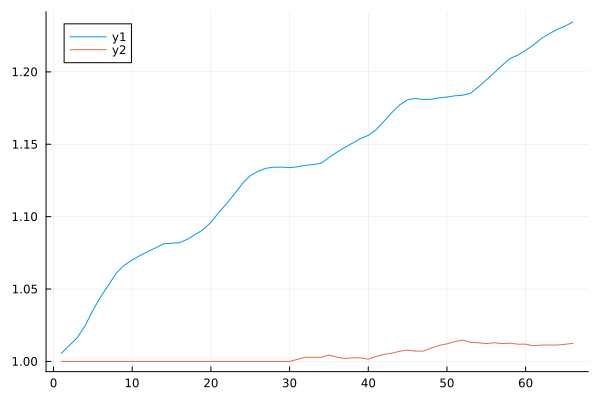

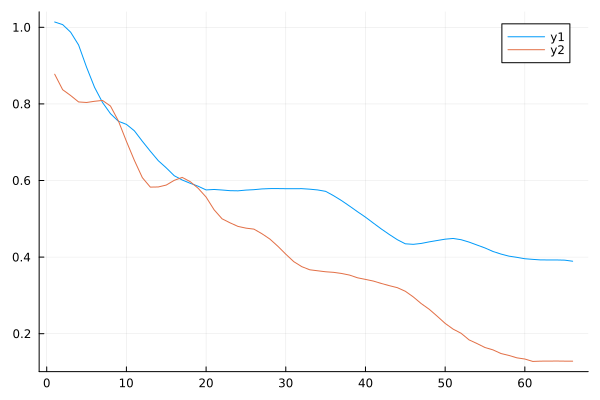

[ Info: Saved animation to /Users/davidmiguezgomez/Library/CloudStorage/GoogleDrive-miguez@cbmso.com/My Drive/Proyectos/fly/Estella/anim_prolif_volume_WT_no_division_if_confluent_e.gif


66-element Vector{Float64}:
 0.8775199999999991
 0.8371199999999992
 0.8219199999999995
 0.8051599999999999
 0.8037599999999999
 0.8068799999999999
 0.8090799999999999
 0.7944438095238091
 0.7552666666666661
 0.7023695238095234
 0.6525523809523807
 0.6074952380952378
 0.5827714285714284
 ⋮
 0.16389065934066238
 0.15778789377289684
 0.1482767032967064
 0.14325857142857457
 0.13699428571428893
 0.13388000000000327
 0.1276030952380986
 0.12835452380952717
 0.12846880952381287
 0.12862595238095573
 0.12835928571428906
 0.1283064285714319

In [20]:
initial_size_x=1.0;
initial_size_y=1.0;

down_left_x=0.0;
down_left_y=0.0;

up_left_x=0.0; 
up_left_y=down_left_y+initial_size_y;

up_right_x=down_left_x+initial_size_x
up_right_y=down_left_y+initial_size_y;

down_right_x=down_left_x+initial_size_x
down_right_y=0.0;

number_of_total_cells=50
# cycle to initiatize all cells in their position 
for iii=1:number_of_total_cells 
    eval(Meta.parse((string("cell_",iii,"=polygono([down_left_x+(initial_size_x*(",iii,"-1)),down_left_y],
                    [down_left_x+(initial_size_x*(",iii,"-1)),up_left_y],
                    [down_left_x+(initial_size_x*(",iii,")),up_right_y],
                    [down_left_x+(initial_size_x*(",iii,")),down_right_y],
                    rand(1),
                    0.0)"))))
end
vector_blue=tissue_growth_proliferation_horizontal_small_cells_only(15,0.01,70000,0.0008/1.2)
#tissue_growth_proliferation_horizontal_small_cells_only(15,0.03,15000,0.0020)


In [21]:
vector_red3=vector_blue;
stdev=std([vector_red1,vector_red2,vector_red3]);
plot([vector_red1,vector_red2,vector_red3]);
plot!(mean([vector_red1,vector_red2,vector_red3]),ribbon = std([vector_red1,vector_red2,vector_red3]))
savefig("plot_width_red.pdf")


LoadError: UndefVarError: vector_red1 not defined

In [22]:
vector_blue2=vector_blue;
stdev=std([vector_blue1,vector_blue2,vector_blue3]);
plot([vector_blue1,vector_blue2,vector_blue3]);
plot!(mean([vector_blue1,vector_blue2,vector_blue3]),ribbon = std([vector_blue1,vector_blue2,vector_blue3]))
#savefig("plot_altura_blue_LOW.pdf")


LoadError: UndefVarError: vector_blue1 not defined

In [23]:
vector_red1=vector_blue;
stdev=std([vector_red1,vector_red2,vector_red3]);
plot([vector_red1,vector_red2,vector_red3]);
plot!(mean([vector_red1,vector_red2,vector_red3]),ribbon = std([vector_red1,vector_red2,vector_red3]))
#savefig("plot_apical_area_red_LOW.pdf")


LoadError: UndefVarError: vector_red2 not defined

In [27]:
function tissue_growth_proliferation_horizontal_small_cells_only_no_special(initial_number_of_cells,growth,total_time,aging)
draw_and_save_every=100
number_of_cells = initial_number_of_cells
size_of_system=initial_number_of_cells*initial_size_x; # calculate the size in x of our system
vector_de_alturas_red = Vector{Float64}(undef,Int(total_time/draw_and_save_every))  
vector_de_alturas_blue = Vector{Float64}(undef,Int(total_time/draw_and_save_every))
vector_de_width_red = Vector{Float64}(undef,Int(total_time/draw_and_save_every))  
vector_de_width_blue = Vector{Float64}(undef,Int(total_time/draw_and_save_every))

# plot the cells 
for iii=1:number_of_cells 
   # location=(eval(Meta.parse((string("cell_",iii)))).p1[1]+eval(Meta.parse((string("cell_",iii)))).p4[1])/2    
    location=midpoint(eval(Meta.parse((string("cell_",iii))))) 
       # println(location)
            if 4.0 > location > 3.0 || 7.0 > location > 6.0 || 10.0 > location > 9.0 || 13.0 > location > 12.0 #  || 16 > location > 15 || 19 > location > 18
                  eval(Meta.parse((string("cell_",iii,"=polygono([down_left_x+(initial_size_x*(",iii,"-1)),down_left_y],
                    [down_left_x+(initial_size_x*(",iii,"-1)),up_left_y],
                    [down_left_x+(initial_size_x*(",iii,")),up_right_y],
                    [down_left_x+(initial_size_x*(",iii,")),down_right_y],
                    rand(1),
                    0.0)"))))
            else
                  eval(Meta.parse((string("cell_",iii,"=polygono([down_left_x+(initial_size_x*(",iii,"-1)),down_left_y],
                    [down_left_x+(initial_size_x*(",iii,"-1)),up_left_y],
                    [down_left_x+(initial_size_x*(",iii,")),up_right_y],
                    [down_left_x+(initial_size_x*(",iii,")),down_right_y],
                    rand(1),
                    0.0)"))))
           
            end
         #eval(Meta.parse("location_of_each_cell[$iii]=cell_$iii.p1[1]"))
       # println(location_of_each_cell)
end
  
 global location_of_each_cell=ones(number_of_cells)   
anim = @animate for i in draw_and_save_every:total_time # cycle to perform the simulation 
plt=plot() 
 
        
       if i % draw_and_save_every == 0 
            location_of_each_cell=ones(number_of_cells+1)
            #println(i)
#Threads.@threads for iii = 2:number_of_cells
        altura_blue=0
        altura_red=0
        width_blue=0
        width_red=0
        number_of_blue_cells=0
        number_of_red_cells=0
            for iii = 2:number_of_cells

            #location=(eval(Meta.parse((string("cell_",iii)))).p1[1]+eval(Meta.parse((string("cell_",iii)))).p4[1])/2
           location=midpoint(eval(Meta.parse((string("cell_",iii)))))           
                if 4.0 > location > 3.0 || 7.0 > location > 6.0 || 10.0 > location > 9.0 || 13.0 > location > 12.0 #  || 16 > location > 15 || 19 > location > 18
                eval(Meta.parse("plot!([cell_$iii.p1[1],cell_$iii.p2[1],cell_$iii.p3[1],cell_$iii.p4[1]],
                    [cell_$iii.p1[2],cell_$iii.p2[2],cell_$iii.p3[2],cell_$iii.p4[2]]
                    ,color = :black,fill = (0, :red),fillalpha = 1-cell_$iii.p3[1]/2+cell_$iii.p2[1]/2)"))
                eval(Meta.parse((string("cell_",iii)))).tipo=0.0 # red cell
                eval(Meta.parse("location_of_each_cell[$iii]=(cell_$iii.p1[1]+cell_$iii.p3[1])/2"))
                #eval(Meta.parse("location_of_each_cell[$iii]=(cell_$iii.p2[1])"))
               altura_red=altura_red+height((eval(Meta.parse("cell_$(iii)"))))
            width_red=width_red+width((eval(Meta.parse("cell_$(iii)"))))

               number_of_red_cells=number_of_red_cells+1
                else
                eval(Meta.parse("plot!([cell_$iii.p1[1],cell_$iii.p2[1],cell_$iii.p3[1],cell_$iii.p4[1]],
                    [cell_$iii.p1[2],cell_$iii.p2[2],cell_$iii.p3[2],cell_$iii.p4[2]]
                    ,color = :black,fill = (0, :blue),fillalpha = 1-cell_$iii.p3[1]/2+cell_$iii.p2[1]/2)"))
                eval(Meta.parse((string("cell_",iii)))).tipo=0.0 # blue cell
                eval(Meta.parse("location_of_each_cell[$iii]=(cell_$iii.p1[1]+cell_$iii.p3[1])/2"))
                #eval(Meta.parse("location_of_each_cell[$iii]=(cell_$iii.p2[1])"))
                altura_blue=altura_blue+height((eval(Meta.parse("cell_$(iii)"))))
                width_blue=width_blue+width((eval(Meta.parse("cell_$(iii)"))))

                number_of_blue_cells=number_of_blue_cells+1
                end
            end

         vector_de_alturas_blue[Int(i/draw_and_save_every)]=altura_blue/number_of_blue_cells
        vector_de_alturas_red[Int(i/draw_and_save_every)]=altura_red/number_of_red_cells
        vector_de_width_blue[Int(i/draw_and_save_every)]=width_blue/number_of_blue_cells
        vector_de_width_red[Int(i/draw_and_save_every)]=width_red/number_of_red_cells

            
        end
#cell_not_growing=chosen_cell_index-1#1+round(Int,(size(collect(2:number_of_total_cells-1))[1]/2))
#volume_of_not_growing_cell=volume_function(eval(Meta.parse((string("cell_",cell_not_growing)))))    
    
hline!([0],color = :black,leg = false,yaxis=[0,4],xaxis=[0,initial_number_of_cells*initial_size_x],axis = false,grid=false,ticks = nothing, border = :none,title="Division")
  
    
       #choose the cell that grows
        #chosen_position=(initial_number_of_cells-2)*initial_size_x*rand(1)
        ##println(chosen_position)
        #chosen_cell_index= 1 + findmin(abs.(location_of_each_cell.-chosen_position))[2]
        ## println(chosen_cell_index)
        
        
         chosen_cell_index=rand(2:number_of_cells-1) # choose the cells that grows each time 
         age_of_chosen_cell=eval(Meta.parse((string("cell_",chosen_cell_index)))).age

        if age_of_chosen_cell[1] > 1.0 # only divide cells that are older than 1.0 
            #println(chosen_cell_index)
            # change old cell
            set_old_cell((eval(Meta.parse("cell_$(chosen_cell_index)"))))
            age_of_divided_cell=eval(Meta.parse((string("cell_",chosen_cell_index)))).age
            #println(age_of_divided_cell)
               # generate a new cell and rename all next cells in the array 
            for iiii = number_of_cells:-1:chosen_cell_index # rename all cells to accomodate the new one
                  eval(Meta.parse("cell_$(iiii+1)=cell_$(iiii)"))
            end 
            # generate a new cell 
            #eval(Meta.parse((string("cell_",chosen_cell_index+1,"=polygono([4.0,0.0],[4.0,1.1],[5.0,1.1],[5.0,0.0],0.0,0.0)"))))
            # change new cell
           # location=(eval(Meta.parse((string("cell_",chosen_cell_index)))).p1[1]+eval(Meta.parse((string("cell_",chosen_cell_index)))).p4[1])/2
           location=midpoint(eval(Meta.parse((string("cell_",chosen_cell_index)))))
            if 4.0 > location > 3.0 || 7.0 > location > 6.0 || 10.0 > location > 9.0 || 13.0 > location > 12.0 #  || 16 > location > 15 || 19 > location > 18
                eval(Meta.parse((string("cell_",chosen_cell_index+1,"=polygono([4.0,0.0],[4.0,1.1],[5.0,1.1],[5.0,0.0],0.0,1.0)"))))    
                set_new_cell_red((eval(Meta.parse("cell_$(chosen_cell_index)"))),(eval(Meta.parse("cell_$(chosen_cell_index+1)"))),(eval(Meta.parse("cell_$(chosen_cell_index+2)"))))    
                 else
                eval(Meta.parse((string("cell_",chosen_cell_index+1,"=polygono([4.0,0.0],[4.0,1.1],[5.0,1.1],[5.0,0.0],0.0,0.0)"))))
                set_new_cell_blue((eval(Meta.parse("cell_$(chosen_cell_index)"))),(eval(Meta.parse("cell_$(chosen_cell_index+1)"))),(eval(Meta.parse("cell_$(chosen_cell_index+2)"))))    
                 end
           
            number_of_cells=number_of_cells+1;  
        end
       # location=(eval(Meta.parse((string("cell_",chosen_cell_index)))).p1[1]+eval(Meta.parse((string("cell_",chosen_cell_index)))).p4[1])/2
       location=midpoint(eval(Meta.parse((string("cell_",chosen_cell_index)))))
            if 4.0 > location > 3.0 || 7.0 > location > 6.0 || 10.0 > location > 9.0 || 13.0 > location > 12.0 #  || 16 > location > 15 || 19 > location > 18
               growth_by_compressing_neighbours_apically_small_cells_only((eval(Meta.parse("cell_$(chosen_cell_index-1)"))),(eval(Meta.parse("cell_$(chosen_cell_index)"))),(eval(Meta.parse("cell_$(chosen_cell_index+1)"))),growth,aging)    
             
            else # if blue, you can grow basally and apically
               growth_by_compressing_neighbours_apically_small_cells_only((eval(Meta.parse("cell_$(chosen_cell_index-1)"))),(eval(Meta.parse("cell_$(chosen_cell_index)"))),(eval(Meta.parse("cell_$(chosen_cell_index+1)"))),growth,aging)    
            end
        # now try to set the location 

        end every draw_and_save_every
        #println(vector_de_alturas_blue)
        println(number_of_cells)
        p1=plot(reduce_size_vector(vector_de_alturas_blue)) # tengo que reducir el tamaño
        p1=plot!(reduce_size_vector(vector_de_alturas_red))
        savefig("plot_altura_WT_no_division_if_confluent_e_no_special.pdf")
        display(p1)
        p2=plot(reduce_size_vector(vector_de_width_blue)) # tengo que reducir el tamaño
        p2=plot!(reduce_size_vector(vector_de_width_red))
        savefig("plot_width_WT_no_division_if_confluent_e_no_special.pdf")
        display(p2)
        gif(anim, "anim_prolif_volume_WT_no_division_if_confluent_e_no_special.gif",fps=60)
    
end

tissue_growth_proliferation_horizontal_small_cells_only_no_special (generic function with 1 method)

46


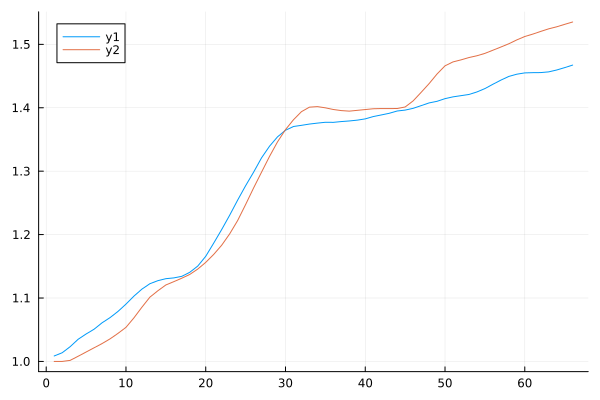

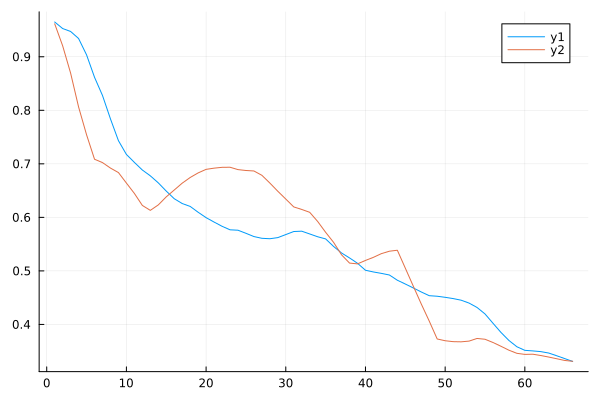

[ Info: Saved animation to /Users/davidmiguezgomez/Library/CloudStorage/GoogleDrive-miguez@cbmso.com/My Drive/Proyectos/fly/Estella/anim_prolif_volume_WT_no_division_if_confluent_e_no_special.gif


Plots.AnimatedGif("/Users/davidmiguezgomez/Library/CloudStorage/GoogleDrive-miguez@cbmso.com/My Drive/Proyectos/fly/Estella/anim_prolif_volume_WT_no_division_if_confluent_e_no_special.gif")
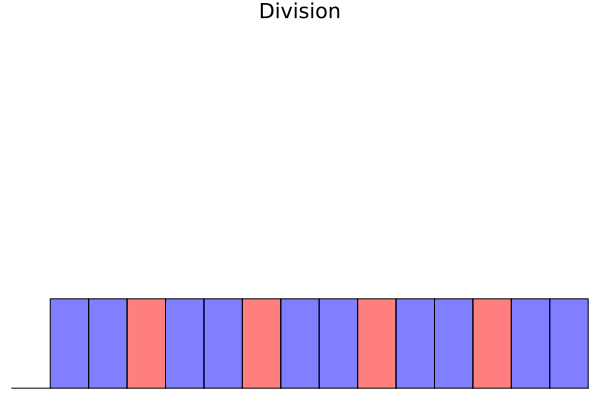

In [25]:
initial_size_x=1.0;
initial_size_y=1.0;

down_left_x=0.0;
down_left_y=0.0;

up_left_x=0.0; 
up_left_y=down_left_y+initial_size_y;

up_right_x=down_left_x+initial_size_x
up_right_y=down_left_y+initial_size_y;

down_right_x=down_left_x+initial_size_x
down_right_y=0.0;

number_of_total_cells=50
# cycle to initiatize all cells in their position 
for iii=1:number_of_total_cells 
    eval(Meta.parse((string("cell_",iii,"=polygono([down_left_x+(initial_size_x*(",iii,"-1)),down_left_y],
                    [down_left_x+(initial_size_x*(",iii,"-1)),up_left_y],
                    [down_left_x+(initial_size_x*(",iii,")),up_right_y],
                    [down_left_x+(initial_size_x*(",iii,")),down_right_y],
                    rand(1),
                    0.0)"))))
end
tissue_growth_proliferation_horizontal_small_cells_only_no_special(15,0.01,70000,0.0008/1.5)
#tissue_growth_proliferation_horizontal_small_cells_only(15,0.03,15000,0.0020)


In [26]:
vector_de_width_blue

LoadError: UndefVarError: vector_de_width_blue not defined